In [1]:
#load modules
import pandas as pd
import scanpy as sc
import numpy as np
import anndata
import os
from collections import Counter
from sklearn.decomposition import PCA
import anndata 


#ploting modules
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns


working_dic="/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/files v10/"
adata_initial = sc.read_h5ad('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/20240220_el_Xenotransplant_BR_CM_PIG_RAW.h5ad')
os.chdir(working_dic)

#color key define
dimplot_color=mcolors.LinearSegmentedColormap.from_list("custom_cmap", ["#E5E5E5","#4C4DB7"])

mkdir -p failed for path /home/jovyan/.cache/matplotlib: [Errno 13] Permission denied: '/home/jovyan/.cache/matplotlib'
Matplotlib created a temporary cache directory at /tmp/matplotlib-8btpce4h because there was an issue with the default path (/home/jovyan/.cache/matplotlib); it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [3]:
adata_initial=sc.read ('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/20240220_el_Xenotransplant_BR_CM_PIG_RAW.h5ad')
print(adata_initial)

AnnData object with n_obs × n_vars = 158266 × 53826
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status', 'Species', 'pCMV_infected'
    var: 'Average_expression'
    uns: 'Sample_ID_colors'


In [3]:
adata_initial

AnnData object with n_obs × n_vars = 158266 × 53826
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status', 'Species', 'pCMV_infected'
    var: 'Average_expression'
    uns: 'Sample_ID_colors'

In [3]:
adata = adata_initial[adata_initial.obs.n_genes > 550, :] 
print(adata)

View of AnnData object with n_obs × n_vars = 137794 × 53826
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status', 'Species', 'pCMV_infected'
    var: 'Average_expression'
    uns: 'Sample_ID_colors'


In [4]:
adata_raw = adata.write ('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/files v10/new_qc_filtered_initial_CM_550g.h5ad')

In [5]:
adata_raw = sc.read ('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/files v10/new_qc_filtered_initial_CM_550g.h5ad')

In [3]:
adata_raw = sc.read ('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/files v10/new_qc_filtered_initial_CM_550g.h5ad')
print(adata_raw)

adata=adata_raw.copy()
adata
adata.obs_names_make_unique()

AnnData object with n_obs × n_vars = 137794 × 53826
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status', 'Species', 'pCMV_infected'
    var: 'Average_expression'
    uns: 'Sample_ID_colors'


/opt/conda/lib/python3.11/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.11/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.11/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.11/site-packages/seaborn/_base.py:948: FutureWarning: When 

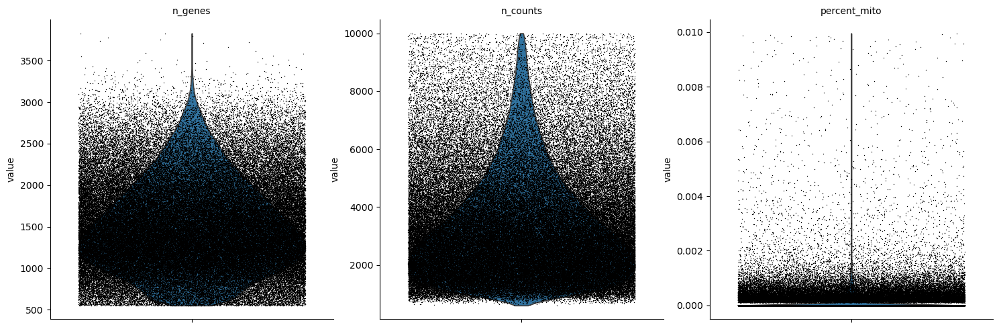

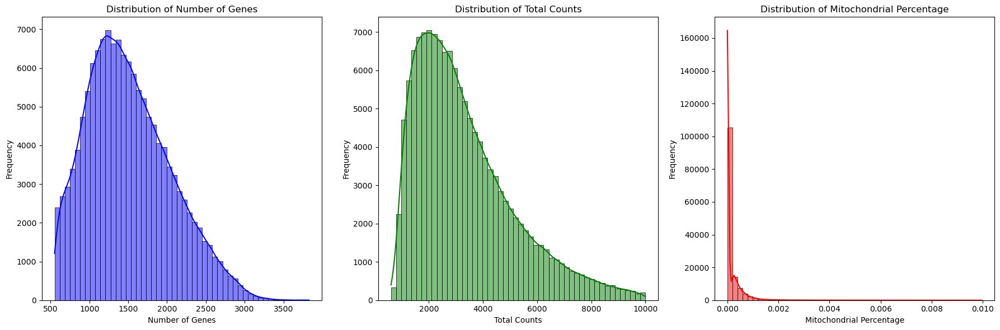

In [7]:
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt"], percent_top=None, log1p=False, inplace=True
)

sc.pl.violin(
    adata,
    ["n_genes", "n_counts", "percent_mito"],
    jitter=0.4,
    multi_panel=True)
# 1. Visualize the distribution of key variables (n_genes, n_counts, percent_mito)
# Plot the distribution of n_genes, n_counts, and percent_mito

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
sns.histplot(adata.obs['n_genes'], kde=True, ax=axes[0], color='blue', bins=50)
axes[0].set_title('Distribution of Number of Genes')
axes[0].set_xlabel('Number of Genes')
axes[0].set_ylabel('Frequency')

sns.histplot(adata.obs['n_counts'], kde=True, ax=axes[1], color='green', bins=50)
axes[1].set_title('Distribution of Total Counts')
axes[1].set_xlabel('Total Counts')
axes[1].set_ylabel('Frequency')

sns.histplot(adata.obs['percent_mito'], kde=True, ax=axes[2], color='red', bins=50)
axes[2].set_title('Distribution of Mitochondrial Percentage')
axes[2].set_xlabel('Mitochondrial Percentage')
axes[2].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

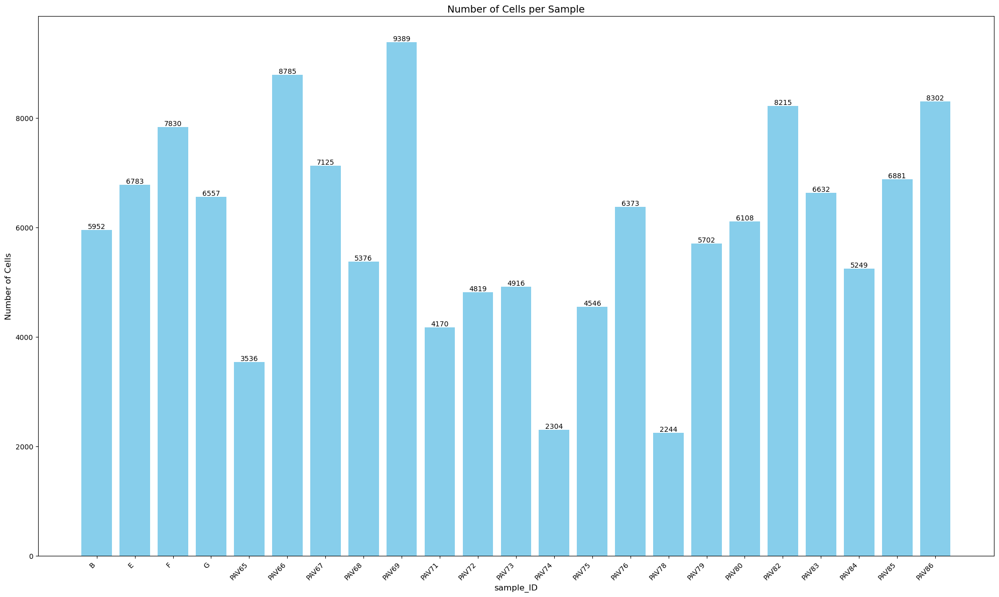

In [8]:
#check the number of nuclei after filters
sample_column = 'Sample_ID'
if sample_column not in adata.obs:
    raise ValueError(f"Column '{sample_column}' not found in adata.obs")

cell_counts = adata.obs[sample_column].value_counts()

cell_counts_df = pd.DataFrame({
    'Sample_ID': cell_counts.index,
    'Cell Count': cell_counts.values
}).sort_values(by='Sample_ID')

plt.figure(figsize=(20, 12))
bars = plt.bar(cell_counts_df['Sample_ID'], cell_counts_df['Cell Count'], color='skyblue')
plt.xlabel('sample_ID', fontsize=12)
plt.ylabel('Number of Cells', fontsize=12)
plt.title('Number of Cells per Sample', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=10)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, str(height), 
             ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

/tmp/ipykernel_3465980/1065013132.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  gene_expression_sums = adata.obs.groupby(sample_column).apply(
/tmp/ipykernel_3465980/1065013132.py:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  gene_expression_sums = adata.obs.groupby(sample_column).apply(


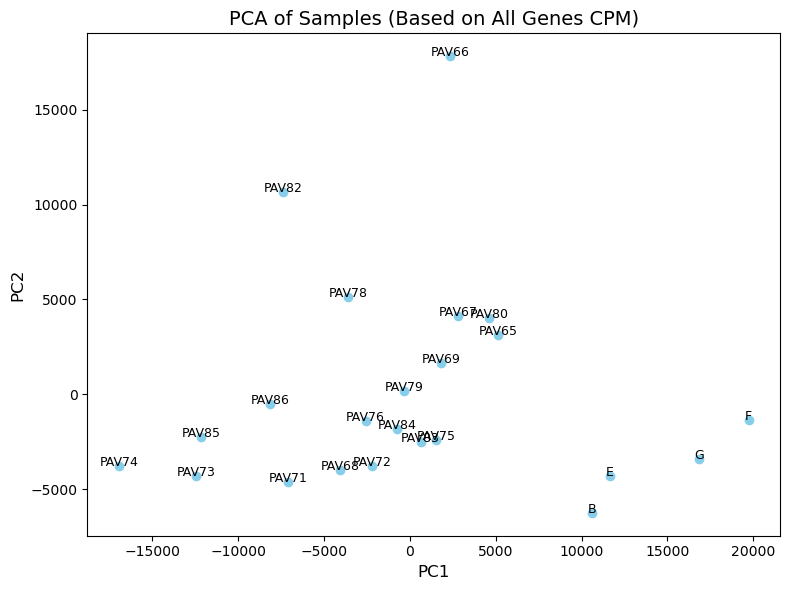

In [9]:
sample_column = 'Sample_ID'

if sample_column not in adata.obs:
    raise ValueError(f"Column '{sample_column}' not found in adata.obs")

gene_expression_sums = adata.obs.groupby(sample_column).apply(
    lambda df: adata[df.index, :].X.sum(axis=0)
)

gene_expression_sums = pd.DataFrame(
    data=np.vstack(gene_expression_sums.values),
    index=gene_expression_sums.index,
    columns=adata.var_names
)

total_expression_per_sample = gene_expression_sums.sum(axis=1)
cpm_normalized = gene_expression_sums.div(total_expression_per_sample, axis=0) * 1e6

pca = PCA(n_components=2)
pca_results = pca.fit_transform(cpm_normalized)

pca_df = pd.DataFrame(
    data=pca_results,
    columns=['PC1', 'PC2'],
    index=gene_expression_sums.index
)

plt.figure(figsize=(8, 6))
plt.scatter(pca_df['PC1'], pca_df['PC2'], color='skyblue')
for i, sample in enumerate(pca_df.index):
    plt.text(pca_df.iloc[i, 0], pca_df.iloc[i, 1], sample, fontsize=9, ha='center')
plt.xlabel('PC1', fontsize=12)
plt.ylabel('PC2', fontsize=12)
plt.title('PCA of Samples (Based on All Genes CPM)', fontsize=14)
plt.tight_layout()
plt.show()

In [10]:
# Now saving a copy of adata (completely raw) as adata_afterinte to start further work without changing the adata format
adata_afterinte = adata.copy()

In [11]:
# Step 2: Preprocess - Normalize and Log Transform
sc.pp.normalize_total(adata_afterinte)
sc.pp.log1p(adata_afterinte)

In [12]:
# Saving the log normalized adata_afterinte as the raw attribute and also separately. If I want the real raw to be saved I should do adata_afterinte.raw = adata.copy() cause adata is still the initial non normalized filed
adata_afterinte.raw = adata_afterinte.copy()

In [13]:
# Saving the log normalized adata_afterinte separately for future label transfer!
log_normalized_adata = adata_afterinte.write ("/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/files v10/log_normalized_adata_before_scale.h5ad")

In [14]:
log_normalized_adata = sc.read ("/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/files v10/log_normalized_adata_before_scale.h5ad")

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


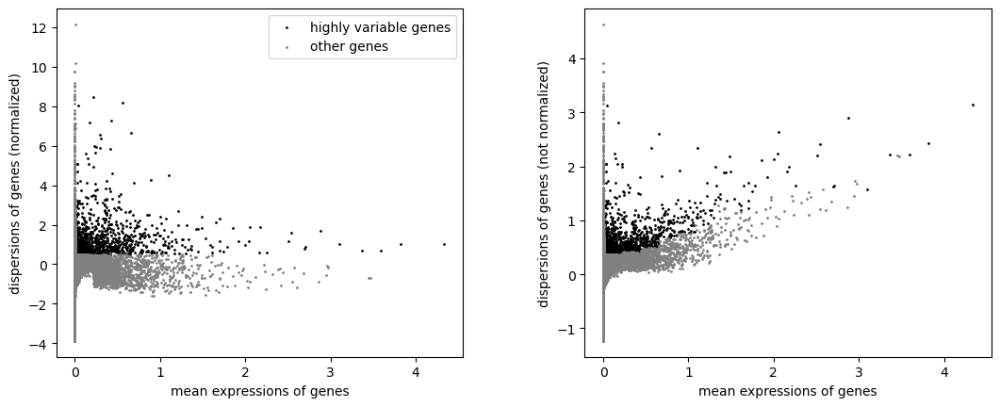

Number of highly variable genes (HVGs): 1237


In [15]:
# Identify highly variable genes
sc.pp.highly_variable_genes(adata_afterinte, min_mean=0.01, max_mean=5, min_disp=0.5)

# Plot highly variable genes

sc.pl.highly_variable_genes(adata_afterinte)

# Count the number of highly variable genes
num_hvgs = adata_afterinte.var['highly_variable'].sum()

# Print the result
print(f"Number of highly variable genes (HVGs): {num_hvgs}")

In [16]:
adata_hvg = adata_afterinte[:, adata_afterinte.var['highly_variable']]

/home/nhadizad/.local/lib/python3.11/site-packages/scanpy/preprocessing/_scale.py:318: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


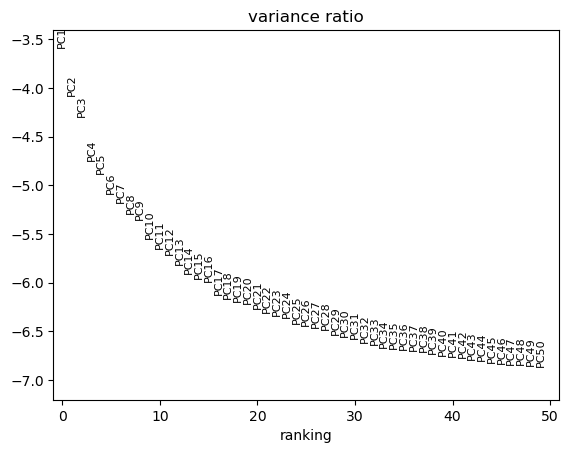

In [17]:
sc.pp.scale(adata_hvg, max_value=10)

sc.pp.pca(adata_hvg, n_comps=50, svd_solver="arpack")
sc.pl.pca_variance_ratio(adata_hvg, log=True, n_pcs=50)

2025-02-26 17:31:51,376 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-02-26 17:32:00,422 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-02-26 17:32:00,979 - harmonypy - INFO - Iteration 1 of 10
2025-02-26 17:32:38,218 - harmonypy - INFO - Iteration 2 of 10
2025-02-26 17:33:20,196 - harmonypy - INFO - Iteration 3 of 10
2025-02-26 17:33:55,985 - harmonypy - INFO - Iteration 4 of 10
2025-02-26 17:34:30,446 - harmonypy - INFO - Iteration 5 of 10
2025-02-26 17:35:13,261 - harmonypy - INFO - Iteration 6 of 10
2025-02-26 17:35:52,561 - harmonypy - INFO - Iteration 7 of 10
2025-02-26 17:36:34,071 - harmonypy - INFO - Iteration 8 of 10
2025-02-26 17:37:45,605 - harmonypy - INFO - Iteration 9 of 10
2025-02-26 17:38:57,241 - harmonypy - INFO - Iteration 10 of 10
2025-02-26 17:40:02,228 - harmonypy - INFO - Stopped before convergence


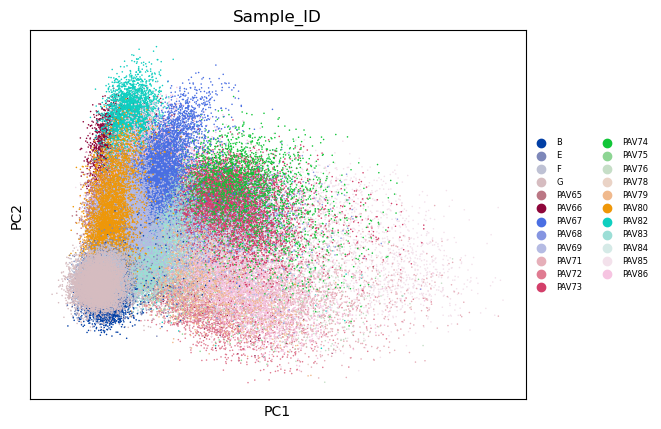

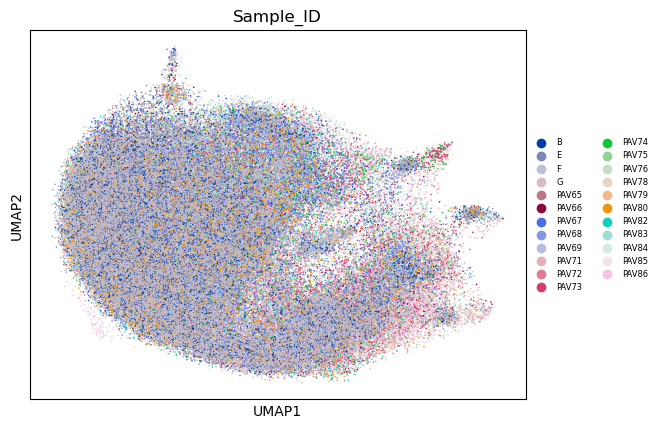

In [18]:
#run harmony
sc.external.pp.harmony_integrate(adata_hvg, "Sample_ID", random_state=15, epsilon_cluster=-np.inf, epsilon_harmony=-np.inf)

sc.pp.neighbors(adata_hvg, n_neighbors=20, n_pcs=50, use_rep="X_pca_harmony")
sc.tl.umap(adata_hvg)
sc.pl.pca_scatter(adata_hvg, color=["Sample_ID"], size=5, legend_fontsize=6)
sc.pl.umap(adata_hvg, color=["Sample_ID"], size=5, legend_fontsize=6)

In [19]:
hm_adata = adata_hvg.write ('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/files v10/harmonized_cm_adata_v10.h5ad')

In [20]:
hm_adata = sc.read ('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/files v10/harmonized_cm_adata_v10.h5ad')

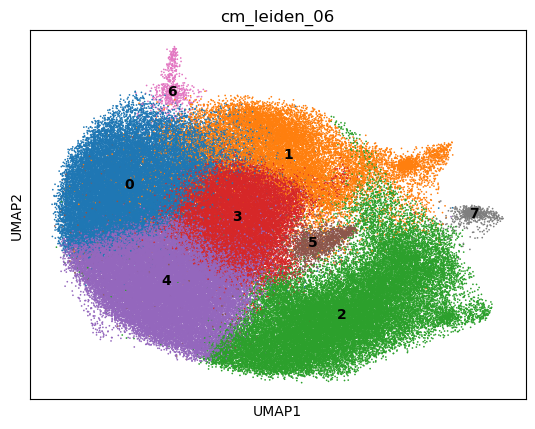

In [21]:
# Run Leiden clustering with the new neighbors graph
sc.tl.leiden(hm_adata, resolution=0.6, key_added="cm_leiden_06", flavor="igraph", directed=False, random_state=15, n_iterations = -1)

# Plot UMAP
sc.pl.umap(
    hm_adata, color=["cm_leiden_06"], legend_loc="on data", size=6
)

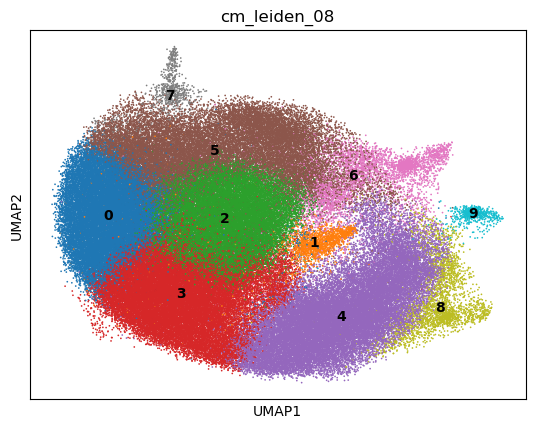

In [22]:
# Run Leiden clustering with the new neighbors graph
sc.tl.leiden(hm_adata, resolution=0.8, key_added="cm_leiden_08", flavor="igraph", directed=False, random_state=15, n_iterations = -1)

# Plot UMAP
sc.pl.umap(
    hm_adata, color=["cm_leiden_08"], legend_loc="on data", size=6
)

In [25]:
clustered_adata = hm_adata.write ('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/files v10/clustered_adata.h5ad')

In [26]:
clustered_adata = sc.read ('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/files v10/clustered_adata.h5ad')

# 📌 Label transfer

In [27]:
log_normalized_adata = sc.read ("/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/files v10/log_normalized_adata_before_scale.h5ad")

In [28]:
# 1️⃣ Transfer 'highly_variable' from clustered_adata.var to log_normalized_adata.var
log_normalized_adata.var["highly_variable"] = False  # Initialize all as False

# Ensure only common genes are updated correctly
common_genes = clustered_adata.var.index.intersection(log_normalized_adata.var.index)
log_normalized_adata.var.loc[common_genes, "highly_variable"] = clustered_adata.var.loc[common_genes, "highly_variable"]

log_normalized_adata.obs['cm_leiden_08'] = clustered_adata.obs['cm_leiden_08']

# 2️⃣ Transfer 'cm_leiden_09_colors' & 'umap' from uns
log_normalized_adata.uns["cm_leiden_08_colors"] = clustered_adata.uns["cm_leiden_08_colors"]
log_normalized_adata.uns["umap"] = clustered_adata.uns["umap"]

# 3️⃣ Transfer 'X_pca_harmony' & 'X_umap' from obsm
log_normalized_adata.obsm["X_pca_harmony"] = clustered_adata.obsm["X_pca_harmony"]
log_normalized_adata.obsm["X_umap"] = clustered_adata.obsm["X_umap"]

In [29]:
# Save the updated log_normalized_adata
processed_LT_cm_adata = log_normalized_adata.write("/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/files v10/processed_label_transferred_cm_adata_v10.h5ad")

In [30]:
processed_LT_cm_adata = sc.read ("/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/files v10/processed_label_transferred_cm_adata_v10.h5ad")

# 📌 DEA

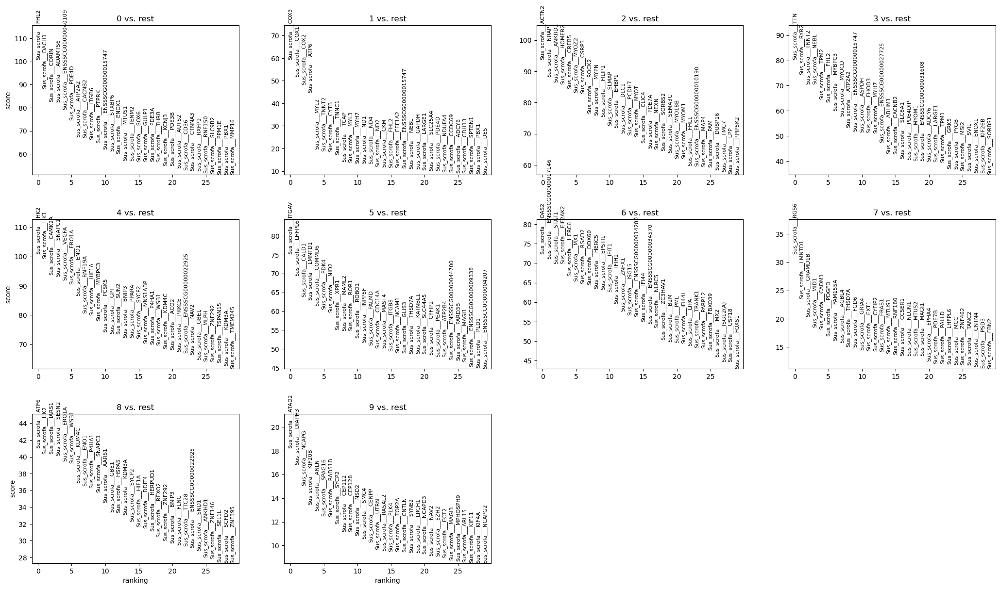

In [31]:
# Perform differential expression to find marker genes for each cluster using Wilcoxon test on raw data
sc.tl.rank_genes_groups(processed_LT_cm_adata, 'cm_leiden_08', method='wilcoxon', key_added='wilcoxon', use_raw=True)

# Visualize the top marker genes for each cluster
sc.pl.rank_genes_groups(processed_LT_cm_adata, key='wilcoxon', n_genes=30, sharey=False)

# Save the DE analysis to an H5AD file
dea_adata = processed_LT_cm_adata.write('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/files v10/DEA_adata_v10.h5ad')

In [33]:
dea_adata = sc.read ('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/files v10/DEA_adata_v10.h5ad')

/home/nhadizad/.local/lib/python3.11/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 53826 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


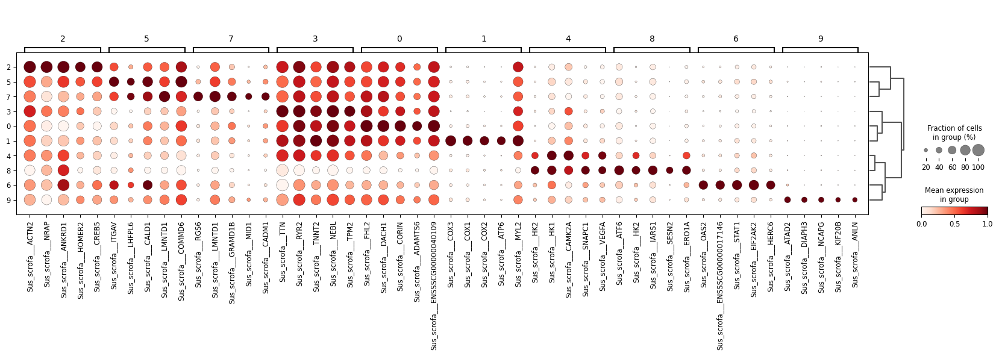

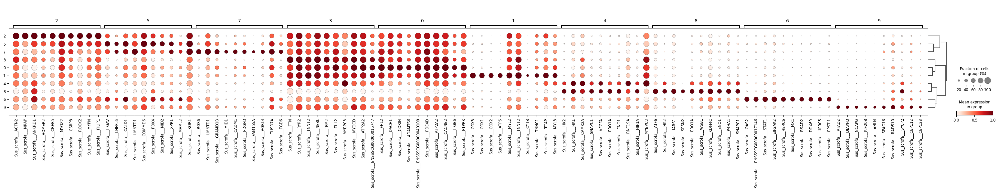

In [34]:
sc.pl.rank_genes_groups_dotplot(dea_adata, key="wilcoxon", n_genes=5, use_raw = True, standard_scale="var"
                                # , cmap="coolwarm", vmin= -1
                               )
sc.pl.rank_genes_groups_dotplot(dea_adata, key="wilcoxon", n_genes=10, use_raw = True, standard_scale="var"
                                # , cmap="coolwarm", vmin= -1
                               )

In [35]:
# Saving wilcoxon results directly
output_dir = '/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/results v10/degs/wilcoxon/'
os.makedirs(output_dir, exist_ok=True)  # Ensure the output directory exists

# Access the DE results stored in dea_adata.uns['wilcoxon']
de_results = dea_adata.uns['wilcoxon']

# Extract log-fold changes, p-values, and adjusted p-values
logfoldchanges = de_results['logfoldchanges']
pvals = de_results['pvals']
pvals_adj = de_results['pvals_adj']

# Loop through each cluster and save DEGs to a separate CSV file
for cluster in dea_adata.obs['cm_leiden_08'].cat.categories:
    # Extract the top genes for the current cluster
    gene_names = de_results['names'][cluster]
    logfc = logfoldchanges[cluster]
    pval = pvals[cluster]
    adj_pval = pvals_adj[cluster]
    
    # Create a DataFrame for the cluster's DEGs
    degs_df = pd.DataFrame({
        'Gene': gene_names,
        'LogFoldChange': logfc,
        'PValue': pval,
        'AdjustedPValue': adj_pval
    })
    
    # Save the DataFrame to a CSV file
    output_file = os.path.join(output_dir, f"DEGs_cluster_{cluster}.csv")
    degs_df.to_csv(output_file, index=False)
    print(f"Saved DEGs for cluster {cluster} to {output_file}")

Saved DEGs for cluster 0 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/results v10/degs/wilcoxon/DEGs_cluster_0.csv
Saved DEGs for cluster 1 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/results v10/degs/wilcoxon/DEGs_cluster_1.csv
Saved DEGs for cluster 2 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/results v10/degs/wilcoxon/DEGs_cluster_2.csv
Saved DEGs for cluster 3 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/results v10/degs/wilcoxon/DEGs_cluster_3.csv
Saved DEGs for cluster 4 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/results v10/degs/wilcoxon/DEGs_cluster_4.csv
Saved DEGs for cluster 5 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/results v10/degs/wilcoxon/DEGs_cluster_5.csv
Saved DEGs

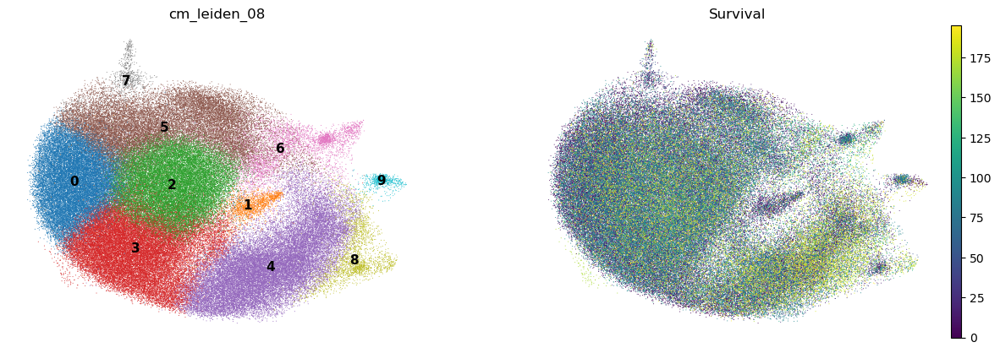

In [36]:
# Plot UMAP with smaller legend font and adjusted legend position
sc.pl.umap(
    dea_adata,
    color=['cm_leiden_08', 'Survival'],
    components=['1,2'],
    frameon=False,
    size=2,
    legend_fontsize=11,  # Set the legend font size to a smaller value
    legend_loc='on data'  # Adjust legend location; can also use 'right margin'
)

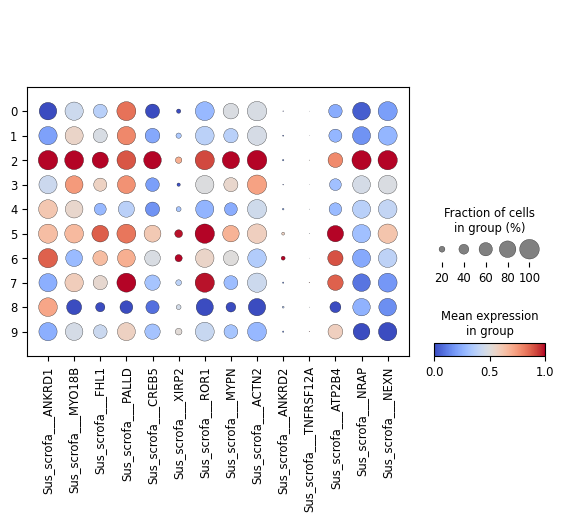

In [55]:
# cluster 2 = vCM3

genes = [ 'Sus_scrofa___ANKRD1', 'Sus_scrofa___MYO18B', 'Sus_scrofa___FHL1', 'Sus_scrofa___PALLD', 'Sus_scrofa___CREB5', 'Sus_scrofa___XIRP2', 'Sus_scrofa___ROR1', 'Sus_scrofa___MYPN', 'Sus_scrofa___ACTN2', 'Sus_scrofa___ANKRD2', 'Sus_scrofa___TNFRSF12A', 'Sus_scrofa___ATP2B4', 'Sus_scrofa___NRAP', 'Sus_scrofa___NEXN'
]
         
# Create the dot plot
sc.pl.dotplot(dea_adata, genes, groupby='cm_leiden_08', use_raw=True, standard_scale="var", cmap="coolwarm")

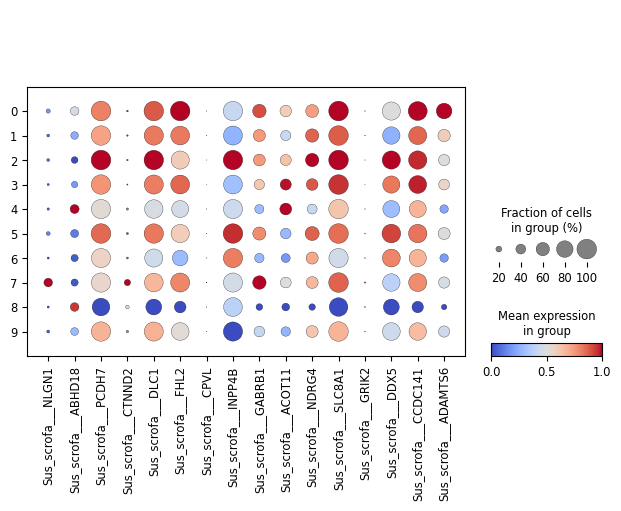

In [53]:
# cluster 2 = vCM3

genes = [ 'Sus_scrofa___NLGN1', 'Sus_scrofa___ABHD18', 'Sus_scrofa___PCDH7', 'Sus_scrofa___CTNND2', 'Sus_scrofa___DLC1', 'Sus_scrofa___FHL2', 'Sus_scrofa___CPVL', 'Sus_scrofa___INPP4B', 'Sus_scrofa___GABRB1', 'Sus_scrofa___ACOT11', 'Sus_scrofa___NDRG4', 'Sus_scrofa___SLC8A1', 'Sus_scrofa___GRIK2', 'Sus_scrofa___DDX5', 'Sus_scrofa___CCDC141', 'Sus_scrofa___ADAMTS6'
]
         
# Create the dot plot
sc.pl.dotplot(dea_adata, genes, groupby='cm_leiden_08', use_raw=True, standard_scale="var", cmap="coolwarm")

In [61]:
cluster_annotations = {
    "0": "vCM1",
    "1": "vCM4",
    "2": "vCM3",
    "3": "vCM1",
    "4": "Hypoxia-adaptive vCM",
    "5": "IFN ISG vCM2",
    "6": "IFN ISG vCM2",
    "7": "vCM5",
    "8": "Hypoxia-adaptive vCM",
    "9": "Proliferative vCM"
}

In [62]:
# Add the manual annotations to the 'dea_adata' object
dea_adata.obs["CM_subtype_annotation"] = dea_adata.obs.cm_leiden_08.astype(str).map(cluster_annotations)

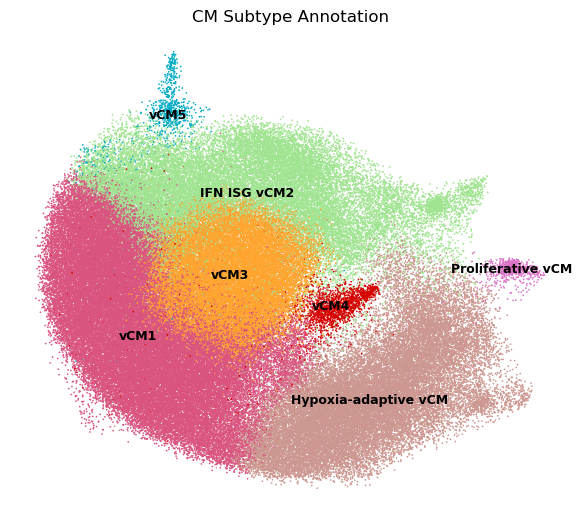

In [68]:
# Define cluster annotations
cluster_annotations = {
    "0": "vCM1",
    "1": "vCM4",
    "2": "vCM3",
    "3": "vCM1",
    "4": "Hypoxia-adaptive vCM",
    "5": "IFN ISG vCM2",
    "6": "IFN ISG vCM2",
    "7": "vCM5",
    "8": "Hypoxia-adaptive vCM",
    "9": "Proliferative vCM"
}

# Map annotations & convert to categorical dtype
dea_adata.obs["CM_subtype_annotation"] = dea_adata.obs["cm_leiden_08"].astype(str).map(cluster_annotations)
dea_adata.obs["CM_subtype_annotation"] = dea_adata.obs["CM_subtype_annotation"].astype("category")  # Convert to categorical

# Define color palette
large_palette = sns.color_palette(cc.glasbey_light, n_colors=120)

# Manually choose specific colors for each cell type
celltype_colors = {
   "vCM1":large_palette[5],
 "vCM4":  large_palette[0],
 "vCM3" : large_palette[5],
"vCM1":large_palette[87],
"Hypoxia-adaptive vCM" : large_palette[56],
"IFN ISG vCM2": large_palette[29],
"IFN ISG vCM2": large_palette[29],
"vCM5": large_palette[3],
"Hypoxia-adaptive vCM" :large_palette[56],
    "Proliferative vCM": large_palette[67]
}

# Ensure the color assignment matches the actual cell types
actual_cell_types = dea_adata.obs["CM_subtype_annotation"].cat.categories  
ordered_colors = [celltype_colors[celltype] for celltype in actual_cell_types]

# Create UMAP plot
fig, ax = plt.subplots(figsize=(7, 6))  # Reduce figure size to tighten layout

sc.pl.umap(dea_adata, color="CM_subtype_annotation",
           palette=ordered_colors, legend_loc="on data", legend_fontsize=9,
           frameon=False, title="CM Subtype Annotation", ax=ax, show=False,  size=6)

# Adjust layout to remove extra padding
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)  

# Save the optimized UMAP plot
plt.savefig('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/results v10/CM_annotation_v5_tight.png', dpi=400, bbox_inches="tight")

# Show the figure
plt.show()

In [69]:
annotated_CM_adata = dea_adata.write ('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/files v10/annotated_CM_adata.h5ad')

In [7]:
annotated_CM_adata = sc.read ('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/files v10/annotated_CM_adata.h5ad')

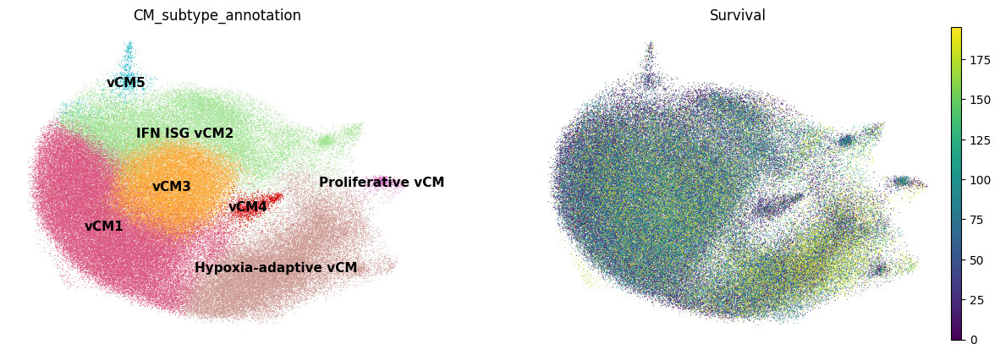

In [8]:
# Plot UMAP with smaller legend font and adjusted legend position
sc.pl.umap(
    annotated_CM_adata,
    color=['CM_subtype_annotation', 'Survival'],
    components=['1,2'],
    frameon=False,
    size=2,
    legend_fontsize=11,  # Set the legend font size to a smaller value
    legend_loc='on data'  # Adjust legend location; can also use 'right margin'
)

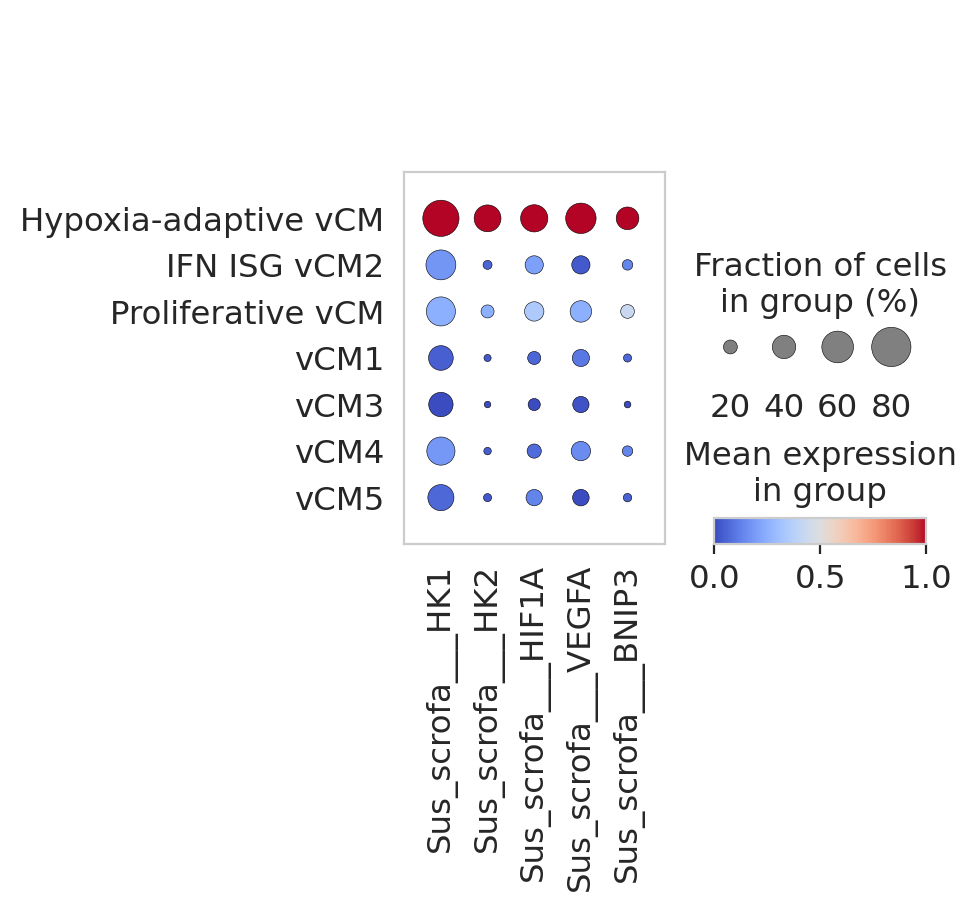

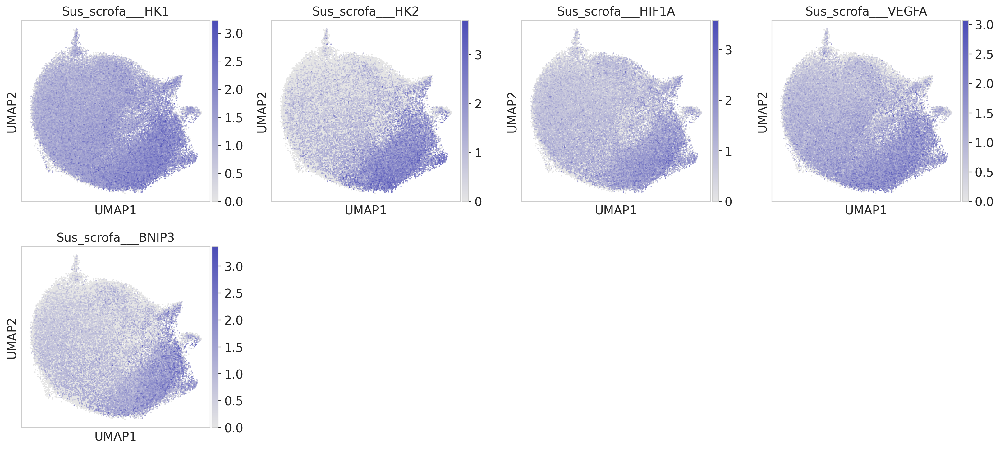

In [163]:
# cluster 5 = Hypoxia-adaptive
# BNIP3 expression contributes mainly to myocardial diastolic dysfunction through mitochondrial apoptosis,
# LV interstitial fibrosis and to some extent to myocardial systolic dysfunction 
# due to the shift of calcium from the ER to the mitochondria and to the decrease in ER calcium content

genes = ["Sus_scrofa___HK1", 
         "Sus_scrofa___HK2", "Sus_scrofa___HIF1A", "Sus_scrofa___VEGFA", "Sus_scrofa___BNIP3"]
         
# Create the dot plot
sc.pl.dotplot(annotated_CM_adata, genes, groupby='CM_subtype_annotation', use_raw=True, standard_scale="var", cmap="coolwarm")

sc.pl.umap(annotated_CM_adata, color=genes, cmap=dimplot_color, size=10)

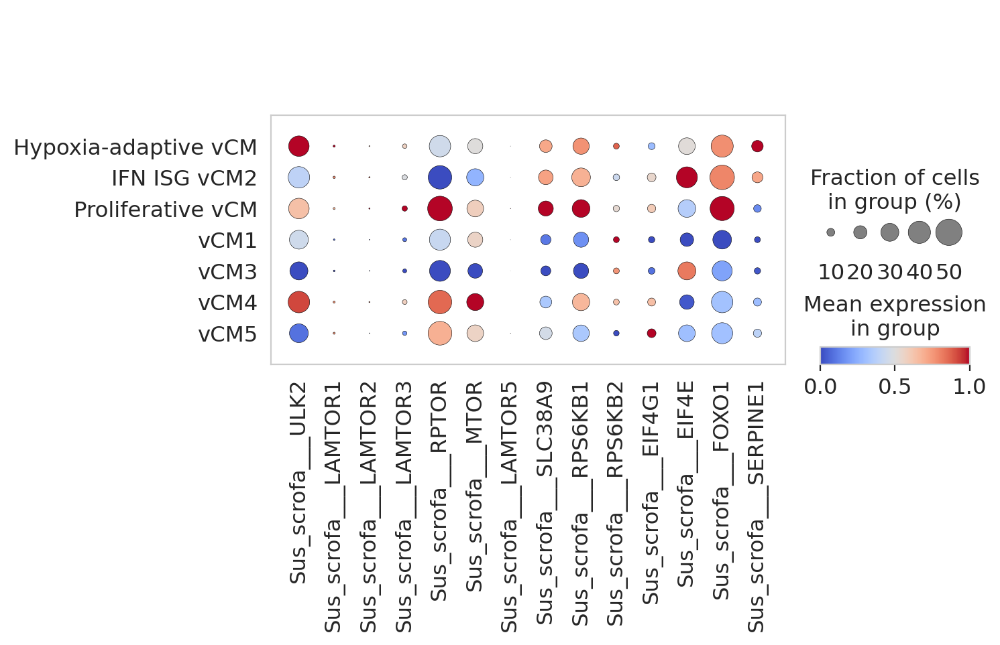

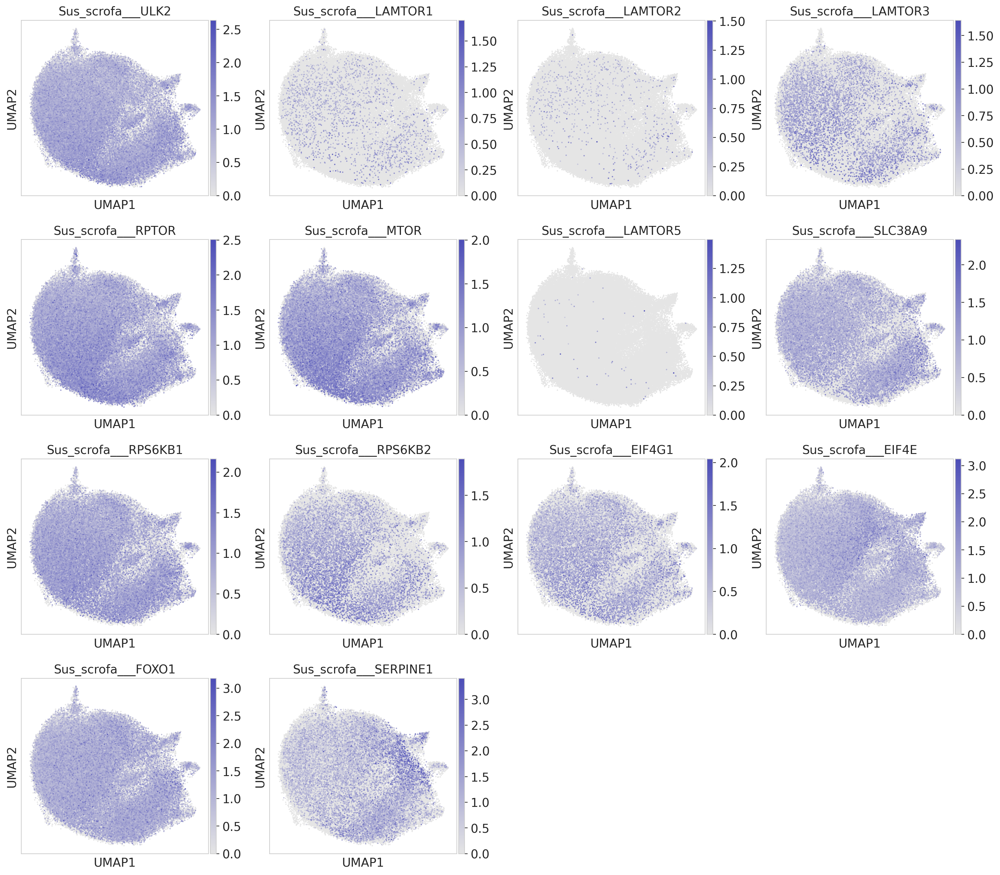

In [165]:
mtor_genes = [

    "Sus_scrofa___ULK2",   # Unc-51 like autophagy activating kinase 2
 # GATOR1 complex component (regulates mTORC1)
    "Sus_scrofa___LAMTOR1", # Ragulator complex component
    "Sus_scrofa___LAMTOR2",
    "Sus_scrofa___LAMTOR3",
"Sus_scrofa___RPTOR", "Sus_scrofa___MTOR",
    "Sus_scrofa___LAMTOR5",
    "Sus_scrofa___SLC38A9", # Amino acid transporter linked to mTORC1
    "Sus_scrofa___RPS6KB1", # Ribosomal protein S6 kinase B1 (S6K1)
    "Sus_scrofa___RPS6KB2", # Ribosomal protein S6 kinase B2 (S6K2)
    "Sus_scrofa___EIF4G1",  # Eukaryotic translation initiation factor 4 gamma 1
    "Sus_scrofa___EIF4E",   # Eukaryotic translation initiation factor 4E
    "Sus_scrofa___FOXO1",     "Sus_scrofa___SERPINE1"   # Forkhead box O1 (downstream of AKT/mTOR)   # Forkhead box O3 (downstream of AKT/mTOR)
]

      
# Create the dot plot
sc.pl.dotplot(annotated_CM_adata, mtor_genes, groupby='CM_subtype_annotation', use_raw=True, standard_scale="var", cmap="coolwarm")

sc.pl.umap(annotated_CM_adata, color=mtor_genes, cmap=dimplot_color, size=10)

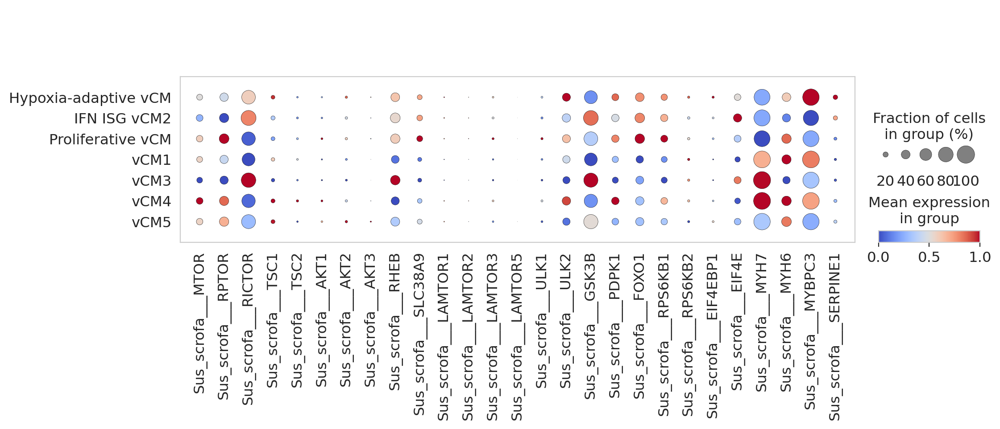

In [149]:
import scanpy as sc

# Define the original genes + extended mTOR-related genes
mtor_genes_extended = [
    "Sus_scrofa___MTOR", "Sus_scrofa___RPTOR", "Sus_scrofa___RICTOR",
    "Sus_scrofa___TSC1", "Sus_scrofa___TSC2", "Sus_scrofa___AKT1",
    "Sus_scrofa___AKT2", "Sus_scrofa___AKT3", "Sus_scrofa___RHEB",
    "Sus_scrofa___SLC38A9", "Sus_scrofa___LAMTOR1", "Sus_scrofa___LAMTOR2",
    "Sus_scrofa___LAMTOR3", "Sus_scrofa___LAMTOR5",
"Sus_scrofa___ULK1", "Sus_scrofa___ULK2",
    "Sus_scrofa___GSK3B", "Sus_scrofa___PDPK1", "Sus_scrofa___FOXO1", "Sus_scrofa___RPS6KB1",
    "Sus_scrofa___RPS6KB2", "Sus_scrofa___EIF4EBP1", "Sus_scrofa___EIF4E",
    "Sus_scrofa___MYH7", "Sus_scrofa___MYH6", "Sus_scrofa___MYBPC3",
    "Sus_scrofa___SERPINE1"
]

# **Dot plot for expression across CM subtypes**
sc.pl.dotplot(
    annotated_CM_adata, mtor_genes_extended, 
    groupby='CM_subtype_annotation', 
    use_raw=True, 
    standard_scale="var", 
    cmap="coolwarm"
)


ranking genes
    finished: added to `.uns['annotated_wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:08:30)


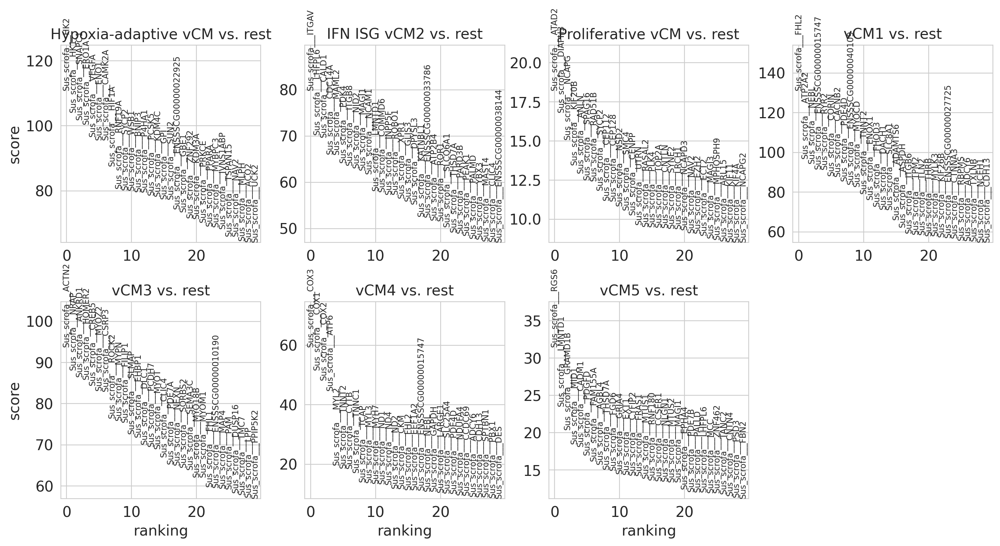

In [167]:
# Perform differential expression to find marker genes for each cluster using Wilcoxon test on raw data
sc.tl.rank_genes_groups(annotated_CM_adata, 'CM_subtype_annotation', method='wilcoxon', key_added='annotated_wilcoxon', use_raw=True)

# Visualize the top marker genes for each cluster
sc.pl.rank_genes_groups(annotated_CM_adata, key='annotated_wilcoxon', n_genes=30, sharey=False)

# Save the DE analysis to an H5AD file
dea_annotated_CM_adata = annotated_CM_adata.write('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/files v10/annotated_DEA_adata_v10.h5ad')

In [2]:
dea_annotated_CM_adata = sc.read ('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/files v10/annotated_DEA_adata_v10.h5ad')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_CM_subtype_annotation']`


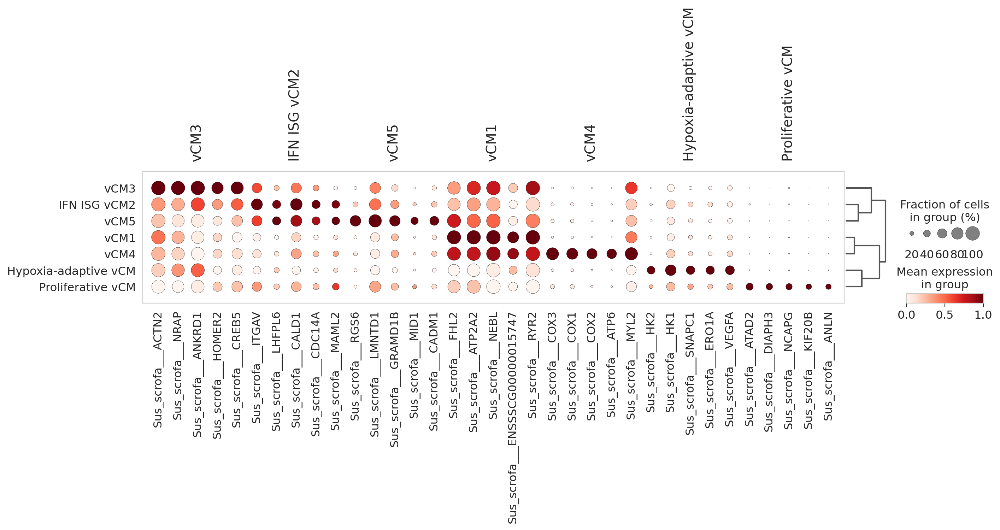

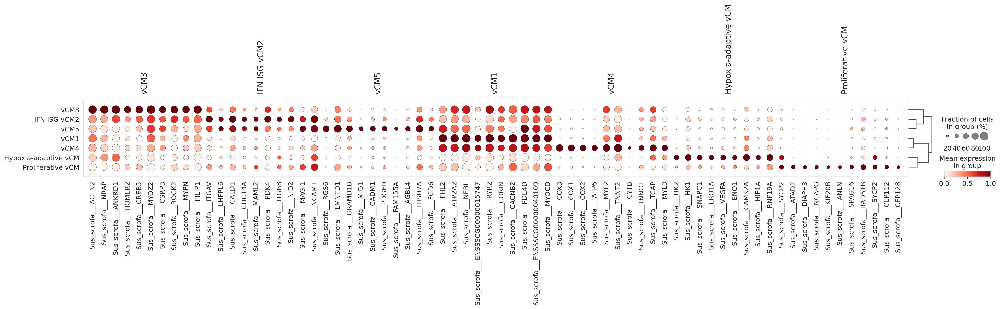

In [169]:
sc.pl.rank_genes_groups_dotplot(dea_annotated_CM_adata, key="annotated_wilcoxon", n_genes=5, use_raw = True, standard_scale="var"
                                # , cmap="coolwarm", vmin= -1
                               )
sc.pl.rank_genes_groups_dotplot(dea_annotated_CM_adata, key="annotated_wilcoxon", n_genes=10, use_raw = True, standard_scale="var"
                                # , cmap="coolwarm", vmin= -1
                               )

In [3]:
final_CM_anndata = sc.read ('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/Time course CM v10/final_annotated_regrouped_CM_adata.h5ad')

In [11]:
final_CM_anndata

AnnData object with n_obs × n_vars = 137794 × 53826
    obs: 'n_genes', 'scrublet_score_default', 'predicted_doublets_default', 'scrublet_score_z', 'predicted_doublets_z', 'scrublet_score_log', 'predicted_doublets_log', 'percent_mito', 'percent_ribo', 'percent_ribo_RPS', 'percent_ribo_RPL', 'n_counts', 'solo_softmax_scores', 'solo_logit_scores', 'solo_is_doublet', 'n_counts_Papio_anubis', 'n_counts_Sus_scrofa', 'n_genes_Papio_anubis', 'n_genes_Sus_scrofa', 'Sample_ID', 'doublets_ncounts', 'pCMV_score', 'n_counts_pCMV', 'leiden_02', 'cell_type', 'cell_type_V1', 'Treatment', 'Survival', 'Endpoint_status', 'Species', 'pCMV_infected', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'cm_leiden_08', 'CM_subtype_annotation', 'new_endpoints'
    var: 'Average_expression', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable'
    uns: 'CM_subtype_annotation_colors', 'Sample_ID_colors', 'annotated_wilcoxon', 'cm_leiden_08_co

In [18]:
# Saving wilcoxon results directly
output_dir = '/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/results v10/degs/Wilcoxon annotated full/'
os.makedirs(output_dir, exist_ok=True)  # Ensure the output directory exists

# Access the DE results stored in dea_adata.uns['wilcoxon']
de_results = final_CM_anndata.uns['annotated_wilcoxon']

# Extract log-fold changes, p-values, and adjusted p-values
logfoldchanges = de_results['logfoldchanges']
pvals = de_results['pvals']
pvals_adj = de_results['pvals_adj']

# Loop through each cluster and save DEGs to a separate CSV file
for cluster in final_CM_anndata.obs['CM_subtype_annotation'].cat.categories:
    # Extract the top genes for the current cluster
    gene_names = de_results['names'][cluster]
    logfc = logfoldchanges[cluster]
    pval = pvals[cluster]
    adj_pval = pvals_adj[cluster]
    
    # Create a DataFrame for the cluster's DEGs
    degs_df = pd.DataFrame({
        'Gene': gene_names,
        'LogFoldChange': logfc,
        'PValue': pval,
        'AdjustedPValue': adj_pval
    })
    
    # Save the DataFrame to a CSV file
    output_file = os.path.join(output_dir, f"DEGs_cluster_{cluster}.csv")
    degs_df.to_csv(output_file, index=False)
    print(f"Saved DEGs for cluster {cluster} to {output_file}")

Saved DEGs for cluster Hypoxia-adaptive vCM to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/results v10/degs/Wilcoxon annotated full/DEGs_cluster_Hypoxia-adaptive vCM.csv
Saved DEGs for cluster IFN ISG vCM2 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/results v10/degs/Wilcoxon annotated full/DEGs_cluster_IFN ISG vCM2.csv
Saved DEGs for cluster Proliferative vCM to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/results v10/degs/Wilcoxon annotated full/DEGs_cluster_Proliferative vCM.csv
Saved DEGs for cluster vCM1 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/results v10/degs/Wilcoxon annotated full/DEGs_cluster_vCM1.csv
Saved DEGs for cluster vCM3 to /data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/results v10/degs/Wilcoxon annotated full/DEGs_cluster_vCM3.

In [14]:
import pandas as pd

if 'annotated_wilcoxon' in final_CM_anndata.uns:
    dea_results = final_CM_anndata.uns['annotated_wilcoxon']
    print(type(dea_results))  # Should be a dictionary
    print(dea_results.keys())  # Should contain CM subtype names


<class 'dict'>
dict_keys(['logfoldchanges', 'names', 'params', 'pvals', 'pvals_adj', 'scores'])


/tmp/ipykernel_3465980/2241181125.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data = obs_data.groupby('CM_subtype_annotation')['Sample_ID'].value_counts(normalize=True).unstack().fillna(0) * 100


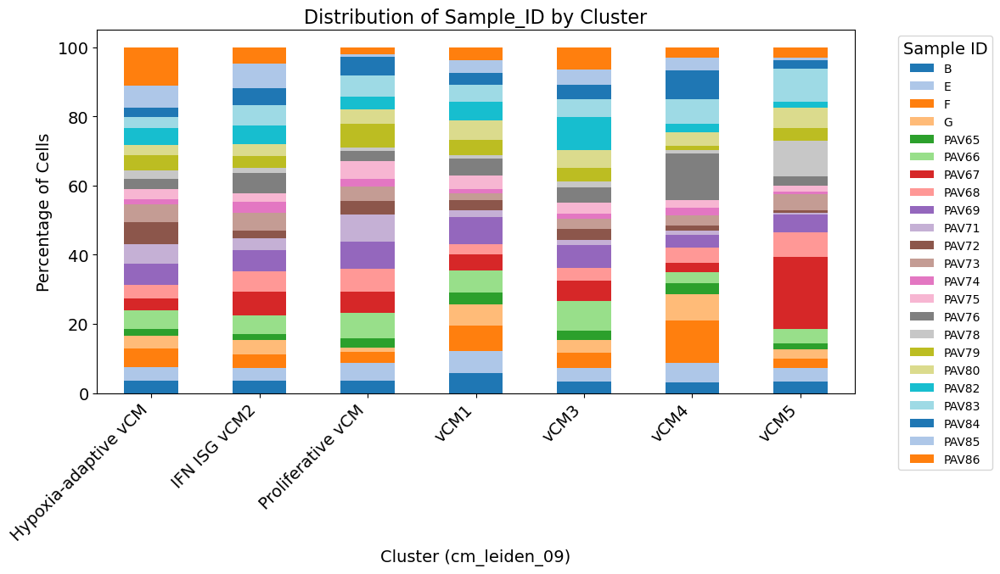

In [94]:
import matplotlib.pyplot as plt
import seaborn as sns

# Extract relevant data
obs_data = annotated_CM_adata.obs[['CM_subtype_annotation', 'Sample_ID']]

# Group by 'cm_leiden_09' and calculate the percentage of each 'Sample_ID'
grouped_data = obs_data.groupby('CM_subtype_annotation')['Sample_ID'].value_counts(normalize=True).unstack().fillna(0) * 100

# Define a larger, more distinct color palette
num_samples = grouped_data.shape[1]  # Number of unique Sample_IDs
palette = sns.color_palette("tab20", num_samples)  # Use 'tab20' for better distinction

# Plot the stacked bar chart with improved colors
ax = grouped_data.plot(kind='bar', stacked=True, figsize=(12, 7), color=palette)

# Customize labels and title
ax.set_xlabel('Cluster (cm_leiden_09)', fontsize=14)
ax.set_ylabel('Percentage of Cells', fontsize=14)
ax.set_title('Distribution of Sample_ID by Cluster', fontsize=16)

# Adjust legend
plt.legend(title='Sample ID', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility

# Show the plot
plt.tight_layout()
plt.show()


In [89]:
def makevector_topmarkers(annotated_CM_adata, top_n, ldFC_cutoff=0.5, pvals_adj_cutoff=10**-20): 
    # Access the 'wilcoxon' results from the uns attribute of the AnnData object
    results = dea_adata.uns['wilcoxon']  
    
    # Get the list of clusters from the DE results
    clusters = results['names'].dtype.names
    
    # Initialize an empty DataFrame to store top genes for each cluster
    top_genes_dict = {}

    # Loop through each cluster to get the top markers
    for cluster in clusters:
        # Filter the top genes based on log fold-change and adjusted p-values
        topgenes_cluster = results['names'][cluster][np.where(
            (results['logfoldchanges'][cluster] >= ldFC_cutoff) &
            (results['pvals_adj'][cluster] < pvals_adj_cutoff)
        )][:top_n]
        
        # Save the top genes for the current cluster
        top_genes_dict[cluster] = topgenes_cluster.tolist()

    # Convert to a DataFrame
    top_genes_df = pd.DataFrame.from_dict(top_genes_dict, orient='index').T
    return top_genes_df

# Example usage
DEGs_xeno = makevector_topmarkers(annotated_CM_adata, top_n=50, ldFC_cutoff=0.5, pvals_adj_cutoff=10**-30)

# Save the results for each cluster as separate CSV files
save_path = "/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/results v10/degs/ei eo filter/"
for cluster in DEGs_xeno.columns:
    cluster_data = DEGs_xeno[[cluster]].dropna()  # Filter data for the cluster
    cluster_data.to_csv(f"{save_path}DEGs_cluster_{cluster}.csv", index=False)

In [82]:
DEGs_xeno=filter_by_expression(annotated_CM_adata, 'cm_leiden_08', key='wilcoxon')
DEGs_xeno.head()

,0_na,0_pv,0_lo,0_pi,0_po,0_ei,0_eo,1_na,1_pv,1_lo,...,8_po,8_ei,8_eo,9_na,9_pv,9_lo,9_pi,9_po,9_ei,9_eo
0,Sus_scrofa___FHL2,0.0,1.097777,0.991315,0.880735,2.345598,1.688338,Sus_scrofa___COX3,0.000000e+00,4.629692,...,0.461644,0.948460,0.373224,Sus_scrofa___ATAD2,2.388744e-69,4.802323,0.417246,0.031107,0.444214,0.019845
1,Sus_scrofa___DACH1,0.0,0.945133,0.965132,0.805911,1.745829,1.240416,Sus_scrofa___COX1,0.000000e+00,4.308411,...,0.167847,0.924379,0.195787,Sus_scrofa___DIAPH3,5.171721e-59,6.386533,0.372740,0.013803,0.510913,0.007939
2,Sus_scrofa___CORIN,0.0,0.995632,0.899738,0.661448,1.356214,0.894090,Sus_scrofa___COX2,0.000000e+00,4.822644,...,0.393893,0.857395,0.309795,Sus_scrofa___NCAPG,4.411958e-47,3.829816,0.360223,0.040015,0.369396,0.030942
3,Sus_scrofa___ADAMTS6,0.0,1.198792,0.736274,0.430436,0.816900,0.438525,Sus_scrofa___ATP6,0.000000e+00,4.986530,...,0.015903,0.518097,0.011718,Sus_scrofa___KIF20B,4.248739e-37,4.955751,0.303199,0.014335,0.245617,0.008931
4,Sus_scrofa___ENSSSCG00000040109,0.0,0.714668,0.984178,0.878841,1.852927,1.453337,Sus_scrofa___MYL2,1.054491e-81,0.751735,...,0.261925,0.925550,0.241343,Sus_scrofa___ANLN,2.923348e-34,4.664251,0.296245,0.019136,0.264164,0.011853


In [2]:
annotated_CM_adata = sc.read ('/data2/core-med1/nhadizad/nastaran/Xenotransplant/Cardiomyocytes/Cardiomyocytes stuff/CM 10/files v10/annotated_CM_adata.h5ad')

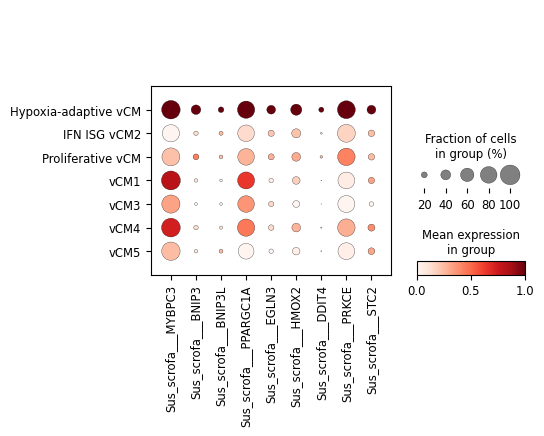

In [13]:
# Hypertrophy genes - 
# MYBPC3 is the most prevalent gene in hypertrophic cardiomyopathy (HCM)
# EGLN3 gene is implicated in cardiac hypertrophy, particularly in the context of hypoxia-induced conditions.
# HMOX2 gene has been implicated in cardiac hypertrophy, particularly in the context of heart failure
# STC2, which encodes stanniocalcin-2, is a protein that can inhibit muscle growth and is upregulated during hypertrophy induced by functional overload.
        # STC2 is a positive regulator in tumor progression at hypoxia. STC2 is a HIF-1 target gene and is involved in the regulation of cell proliferation.
# BNIP3 is an autophagy/mitophagy regulator known to promote cardiac hypertrophy by mediating inflammatory response and signaling pathways responsible for abnormal mitophagy and apoptosis in cardiomyocytes.
# BNIP3L expression is consistent with myocardial hypertrophy and fibrosis in

hypertrophy_genes = ["Sus_scrofa___MYBPC3", "Sus_scrofa___BNIP3", "Sus_scrofa___BNIP3L", "Sus_scrofa___PPARGC1A",
                     "Sus_scrofa___EGLN3", "Sus_scrofa___HMOX2", "Sus_scrofa___DDIT4",
                     "Sus_scrofa___PRKCE","Sus_scrofa___STC2"
]

# Create the dot plot
sc.pl.dotplot(annotated_CM_adata, hypertrophy_genes, groupby='CM_subtype_annotation', use_raw=True, 
              standard_scale="var",
              # cmap="coolwarm"
             )

In [97]:
def correlation_analysis(scanpy_object, column_tosplitby, sum_or_mean):
    d = {}
    for cluster_number in np.unique(scanpy_object.obs[column_tosplitby].values):
        #cluster_number=np.unique(heart.obs['louvain_annotated'].values)[1]
        scanpy_object_subset = scanpy_object[scanpy_object.obs[column_tosplitby].isin([cluster_number])]

        if sum_or_mean=="mean":
            d[cluster_number] = np.squeeze(np.asarray(scanpy_object_subset.raw.X.mean(axis=0))) #np.log(+1)
        elif sum_or_mean=="sum":
            d[cluster_number] = np.squeeze(np.asarray(scanpy_object_subset.raw.X.sum(axis=0))) #np.log(+1)
        del scanpy_object_subset
        
    return d

In [100]:
def stacked_barplot(annotated_CM_adata, xaxis, stack, xaxis_label, legend_label, shift_top=0.2, xaxis_rotation=45, figsize=(10,10), percent=False):
    tmp=pd.crosstab(annotated_CM_adata.obs[xaxis],
                annotated_CM_adata.obs[stack]).sum(axis=1)
    
    ax= pd.crosstab(annotated_CM_adata.obs[xaxis], 
                    annotated_CM_adata.obs[stack])#.apply(lambda r: r/r.sum()*100, axis=1)
    #ax_1 = ax.plot.bar(figsize=(10,10),stacked=True, rot=0, colors=colors)
    ax_1 = ax.plot.bar(figsize=figsize,stacked=True, rot=0)
    #display(ax)
    #plt.legend(title="Subject") # loc='upper center', bbox_to_anchor=(0.1, 1.0), 
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title=legend_label)
    plt.xlabel(xaxis_label,fontweight="bold")
    plt.ylabel('Percent Distribution',fontweight="bold")
    
    if percent:
        for rec in ax_1.patches:
            height = rec.get_height()
            ax_1.text(rec.get_x() + rec.get_width() / 2, rec.get_y() + height/2, "{:.0f}%".format(height),
                   ha = 'center', va='center', fontsize=14.5, weight='bold') #
    
    for xaxistick in range(ax.shape[0]):
        ax_1.text(xaxistick-shift_top,110,tmp[xaxistick],va='center', rotation=45, fontsize=14.5, weight='bold')
    
    plt.xticks(rotation=xaxis_rotation)
    
    ax_1.grid(False)
    plt.show()

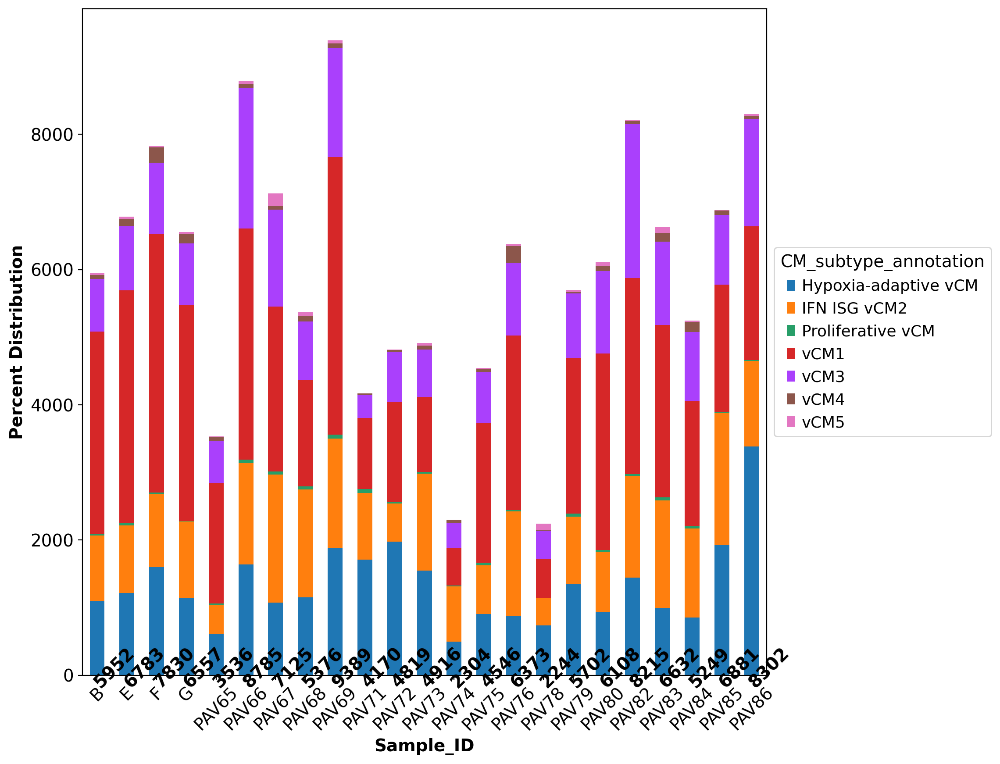

In [101]:
stacked_barplot(
    annotated_CM_adata, 
    xaxis='Sample_ID', stack='CM_subtype_annotation', 
    xaxis_label='Sample_ID',  legend_label='CM_subtype_annotation',
    shift_top=0.2, 
    xaxis_rotation=45, 
    figsize=(10, 10), 
    percent=False
)

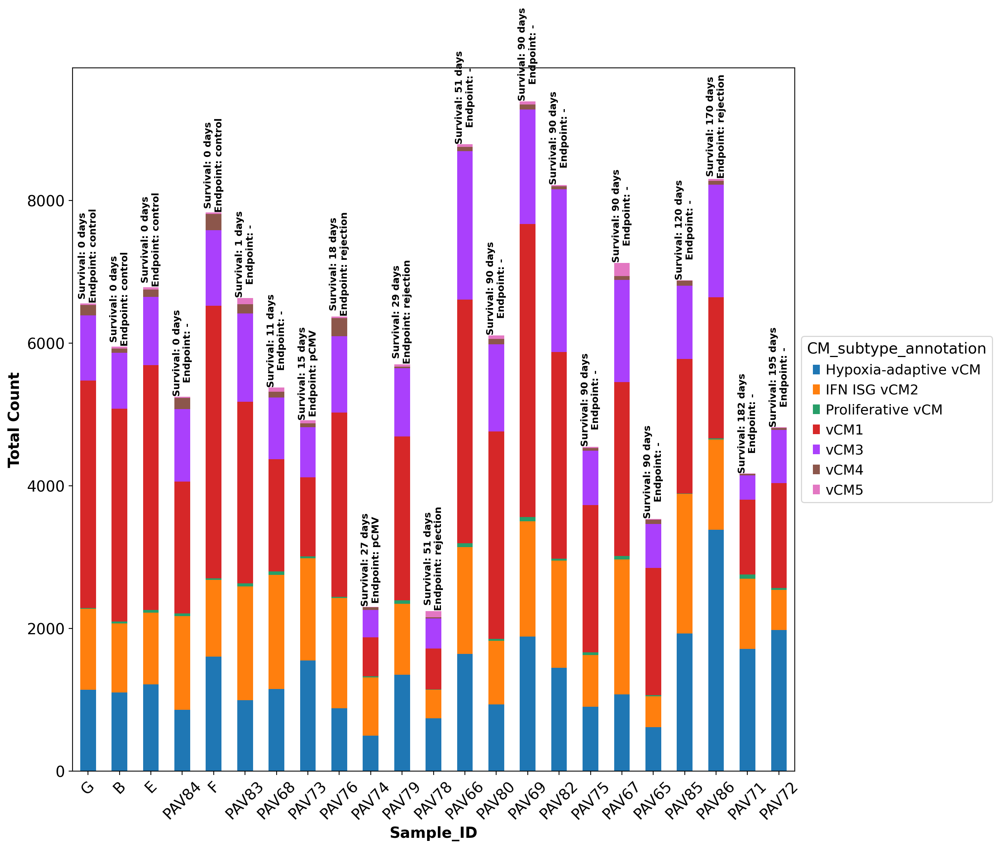

In [102]:
import pandas as pd
import matplotlib.pyplot as plt

def grouped_and_sorted_barplot(data, xaxis, stack, survival_col, endpoint_status_col, xaxis_label, legend_label, 
                               shift_top=0.2, xaxis_rotation=45, figsize=(10,10), percent=False):
    """
    Creates a grouped and sorted stacked bar plot, organizing Sample_IDs by survival values (ascending).
    
    Parameters:
        data: AnnData object
        xaxis: str, column for x-axis categories (e.g., 'Sample_ID')
        stack: str, column for stacking categories
        survival_col: str, column with survival data
        endpoint_status_col: str, column with endpoint status data
        xaxis_label: str, label for x-axis
        legend_label: str, label for legend title
        shift_top: float, adjustment for top annotations
        xaxis_rotation: int, rotation angle for x-axis labels
        figsize: tuple, figure size
        percent: bool, if True, add percentage labels to the bars
    """
    # Sort the Sample_IDs by the survival time (ascending)
    ordered_sample_ids = data.obs.sort_values(by=survival_col)[xaxis].unique().tolist()

    # Ensure all Sample_IDs in the dataset are in the categories
    all_sample_ids = data.obs[xaxis].unique()
    ordered_sample_ids = [sid for sid in ordered_sample_ids if sid in all_sample_ids]

    # Update the Categorical column for plotting
    data.obs[xaxis] = pd.Categorical(data.obs[xaxis], categories=ordered_sample_ids, ordered=True)

    # Prepare the plot data for total counts
    tmp = pd.crosstab(data.obs[xaxis], data.obs[stack]).sum(axis=1)
    ax = pd.crosstab(data.obs[xaxis], data.obs[stack])

    # Plot the stacked bar chart with total counts
    ax_1 = ax.plot.bar(figsize=figsize, stacked=True, rot=0)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title=legend_label)
    plt.xlabel(xaxis_label, fontweight="bold")
    plt.ylabel('Total Count', fontweight="bold")

    # Add annotations above each bar showing the Survival time and Endpoint status
    for xaxistick in range(ax.shape[0]):
        survival_time = data.obs.loc[data.obs[xaxis] == ordered_sample_ids[xaxistick], survival_col].iloc[0]
        endpoint_status = data.obs.loc[data.obs[xaxis] == ordered_sample_ids[xaxistick], endpoint_status_col].iloc[0]
        ax_1.text(
            xaxistick, tmp.iloc[xaxistick] + 5, f'Survival: {survival_time} days\nEndpoint: {endpoint_status}',
            ha='center', va='bottom', fontsize=9, weight='bold', rotation=90
        )

    ## Add count annotations at the top of each bar
    #for xaxistick in range(ax.shape[0]):
    #    ax_1.text(
    #        xaxistick - shift_top, tmp.iloc[xaxistick] + 5, tmp.iloc[xaxistick],
    #        va='center', rotation=45, fontsize=14.5, weight='bold'
    #    )

    # Finalize x-axis rotation and grid
    plt.xticks(rotation=xaxis_rotation)
    ax_1.grid(False)
    plt.show()

# Call the function with MYELOIDS_harmony
grouped_and_sorted_barplot(
    annotated_CM_adata,
    xaxis='Sample_ID', 
    stack='CM_subtype_annotation', 
    survival_col='Survival',
    endpoint_status_col='Endpoint_status',  # Endpoint status column
    xaxis_label='Sample_ID', 
    legend_label='CM_subtype_annotation', 
    shift_top=0.2, 
    xaxis_rotation=45, 
    figsize=(12, 12), 
    percent=False
)
